In [94]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2
from torch.utils.data import DataLoader
import os
import argparse

from sam_whistle.dataset import WhistleDataset
from sam_whistle.config import Args
from sam_whistle import utils
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [95]:
args = Args()
dataset = WhistleDataset(args, 'train')
dataloader = DataLoader(dataset, batch_size=1, shuffle=True, num_workers=os.cpu_count(),)

(769, 1500, 3)


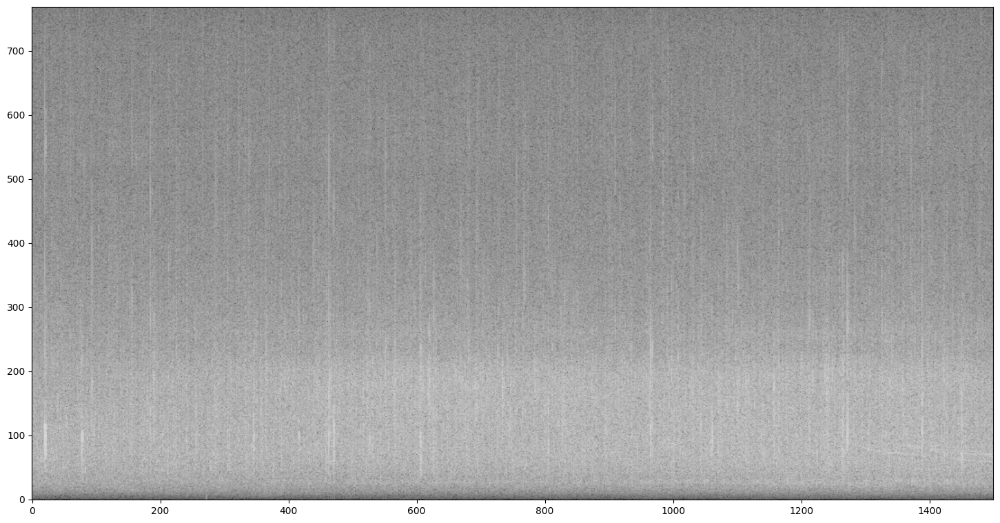

In [96]:
data = dataset[0]
spect, bboxes, contours = data
height, width, _ = spect.shape
print(spect.shape)
fig, ax = plt.subplots(figsize=(width / 100, height / 100), dpi=100)
utils.show_spect(spect, fig, save = '../imgs/test.png')

In [97]:
from segment_anything import sam_model_registry, SamPredictor
sam_checkpoint = "../checkpoints/sam_vit_h_4b8939.pth"
model_type = "vit_h"
device = "cuda"
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)
predictor = SamPredictor(sam)

../checkpoints/sam_vit_h_4b8939.pth


{'left': 2, 'top': 2, 'right': 2, 'bottom': 2}
8
[[1276.41265193  705.71806167]
 [1276.41265193  691.20264317]
 [1397.60049724  705.71806167]
 [1337.00657459  705.71806167]
 [1397.60049724  676.68722467]
 [1397.60049724  691.20264317]
 [1276.41265193  676.68722467]
 [1337.00657459  676.68722467]]
{'left': 2, 'top': 2, 'bottom': 2}
10
[[1435.94303867  718.29938106]
 [1435.94303867  712.53438914]
 [1435.94303867  706.76939721]
 [1500.          718.29938106]
 [1467.97151934  718.29938106]
 [1397.60049724  676.68722467]
 [1397.60049724  691.20264317]
 [1435.94303867  701.00440529]
 [1457.29535912  701.00440529]
 [1478.64767956  701.00440529]]


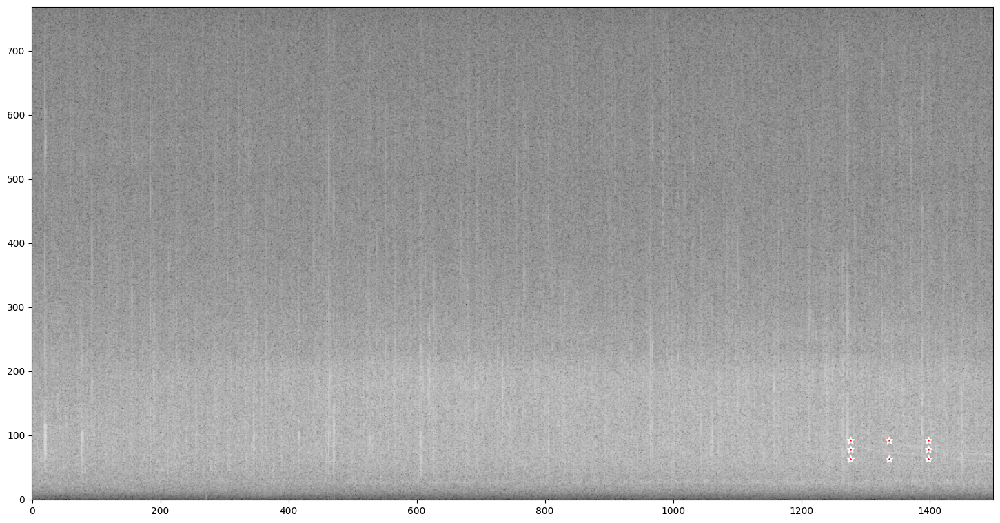

In [127]:
predictor.set_image(spect)
prompts = utils.get_point_prompts(data, n_pos=8, box_pad= 5)
points, labels = prompts[0]
# print(points.shape, labels.shape)
# print(points, labels)

fig, ax = plt.subplots(figsize=(width / 100, height / 100), dpi=100)
utils.show_spect(spect, fig)
utils.show_points(points[8:], labels[8:], ax, inverse=height)
fig.savefig('../imgs/test_points.png',bbox_inches='tight')

In [131]:
masks, scores, logits  = predictor.predict(
    point_coords=points,
    point_labels=labels,
    # box=input_box,
    mask_input=None,
    multimask_output=True,
)

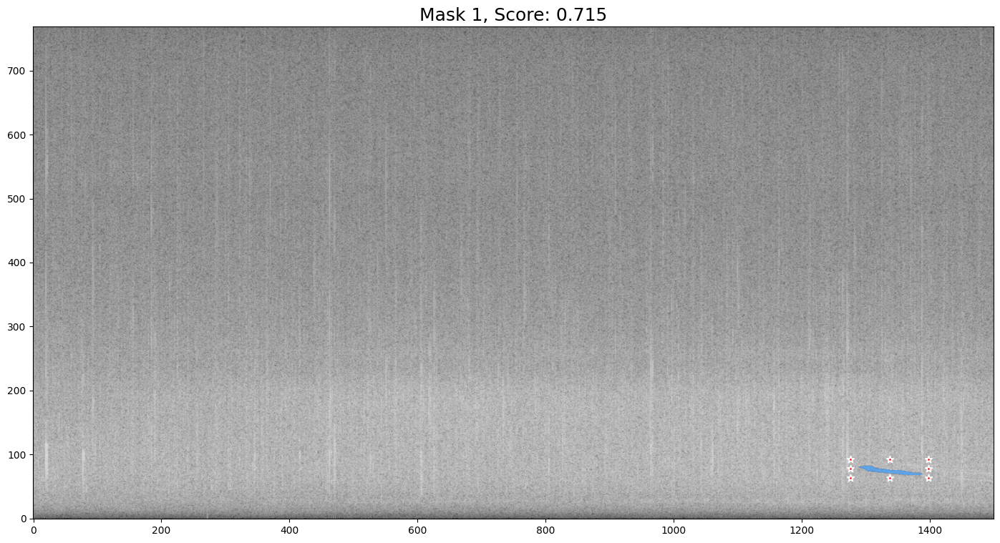

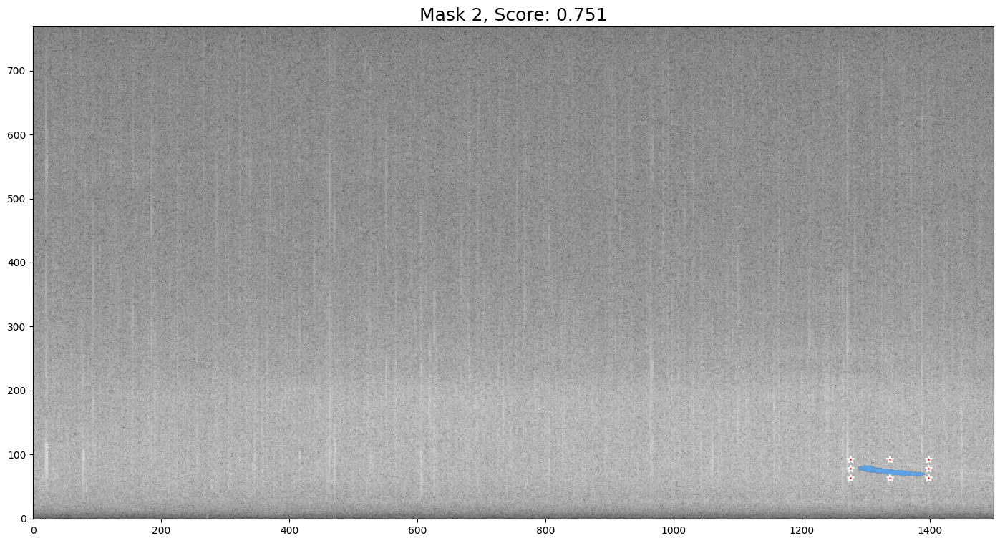

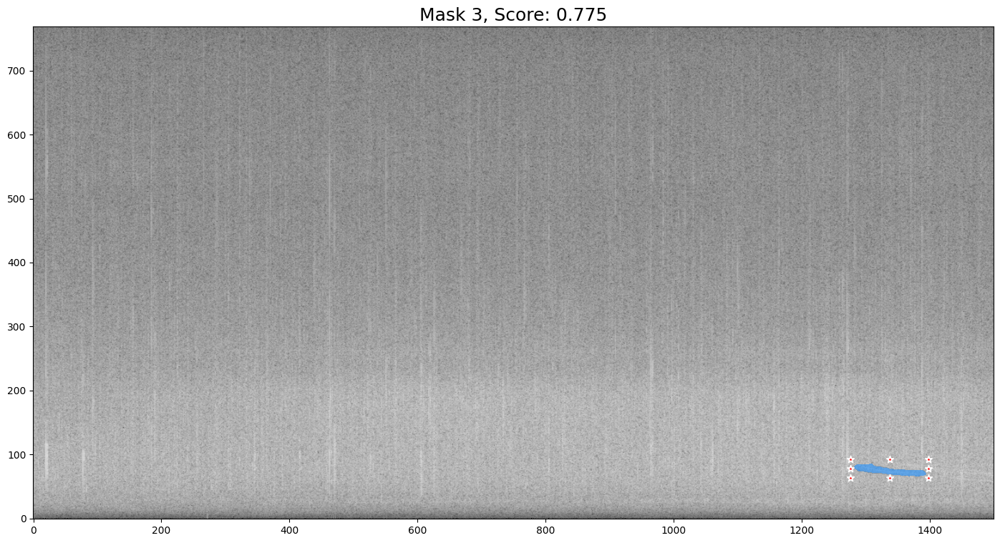

In [139]:
mask_input = logits[np.argmin(scores), :, :]  # Choose the model's best mask
masks, scores, logits  = predictor.predict(
    point_coords=points,
    point_labels=labels,
    # box=input_box,
    mask_input=mask_input[None, :, :],
    multimask_output=True,
)
for i, (mask, score) in enumerate(zip(masks, scores)):
    
    fig, ax = plt.subplots(figsize=(width / 100, height / 100), dpi=100)
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    utils.show_spect(spect, fig)
    utils.show_mask(mask, ax)
    utils.show_points(points[8:], labels[8:], ax, inverse=height)
    fig.savefig(f'../imgs/test_mask_{i}.png',bbox_inches='tight')

(8, 2) (8,)
(8, 2) (8,)


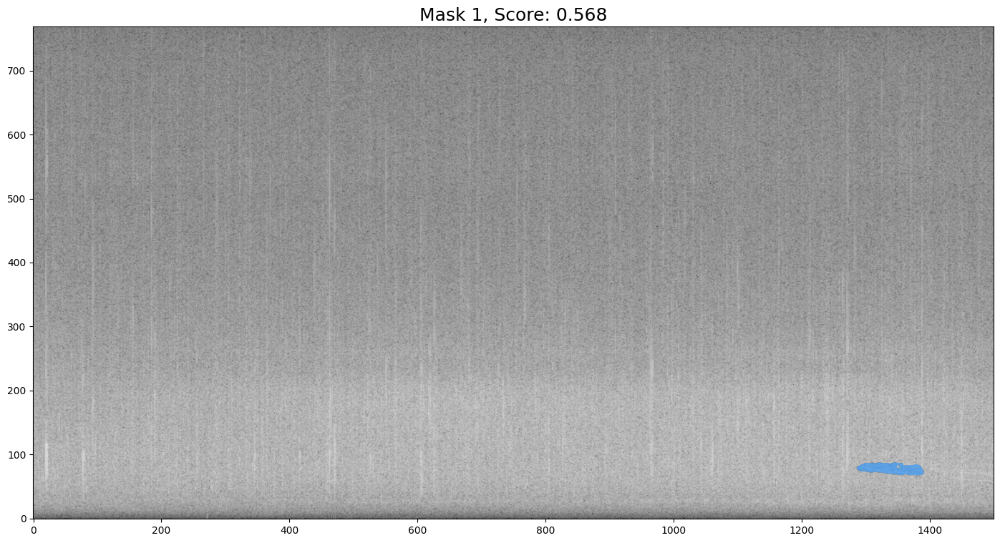

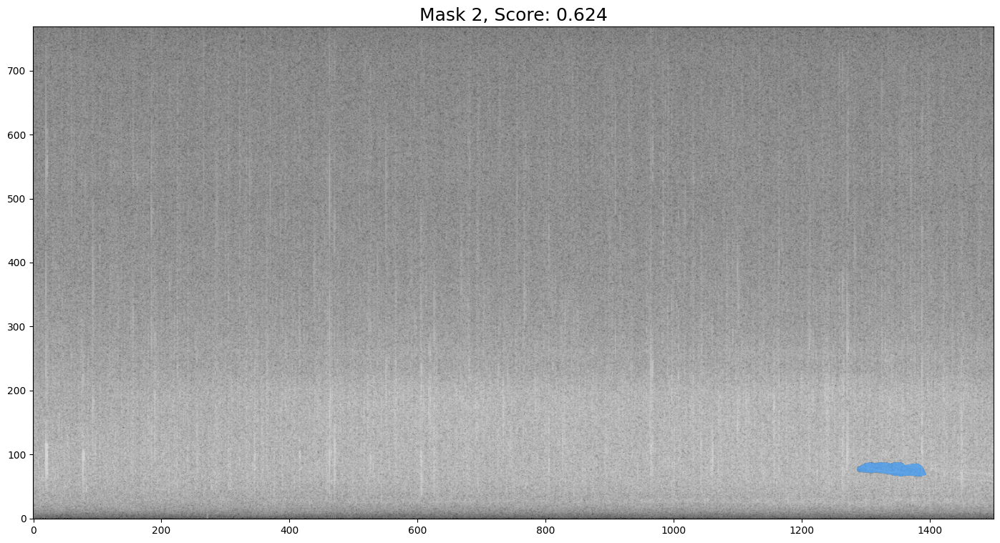

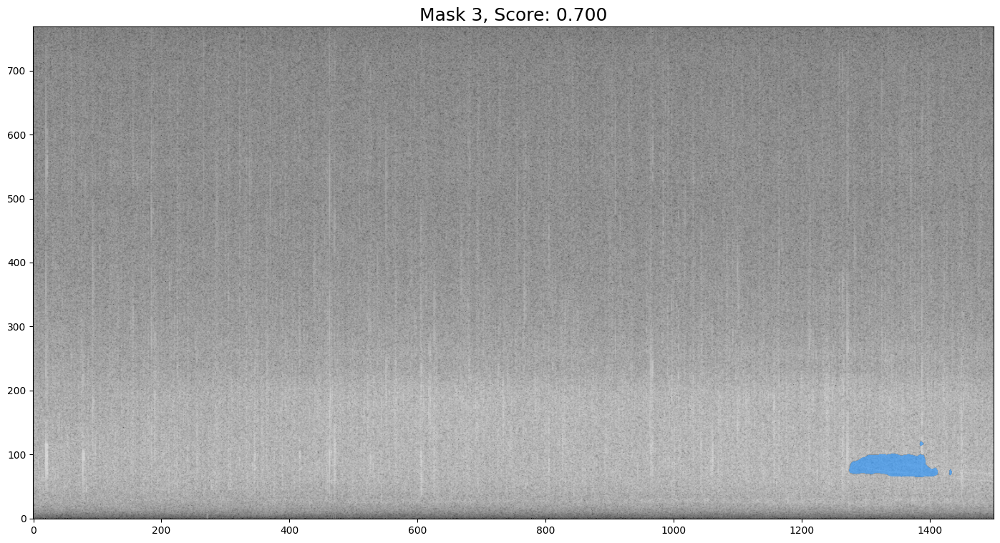

In [146]:
sep_points = [points[8:], points[:8]]
sep_labels = [labels[8:], labels[:8]]
for i in range(len(sep_points)):
    point, label = sep_points[i], sep_labels[i]
    print(point.shape, label.shape)
    # print(point.shape, label.shape,)
    if i == 0:
        mask_input = None
    else:
        mask_input = logits[np.argmin(scores), :, :] 
        mask_input=mask_input[None, :, :]
    
    masks, scores, logits  = predictor.predict(
        point_coords=point,
        point_labels=label,
        # box=input_box,
        mask_input=mask_input,
        multimask_output=True,
    )
    # if  i ==9:
    #     break
for i, (mask, score) in enumerate(zip(masks, scores)):
    
    fig, ax = plt.subplots(figsize=(width / 100, height / 100), dpi=100)
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    utils.show_spect(spect, fig)
    utils.show_mask(mask, ax)
    